In [58]:
# para la lección de hoy tendremos que instalar la siguiente librería. Recordad eliminar "#"
# !pip install scipy

In [59]:
# importamos las librerías que necesitamos

# Tratamiento de datos
# -----------------------------------------------------------------------
import pandas as pd
import numpy as np

# Visualización
# ------------------------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

# Evaluar linealidad de las relaciones entre las variables
# ------------------------------------------------------------------------------
from scipy.stats import shapiro, kstest

# Configuración
# -----------------------------------------------------------------------
pd.set_option('display.max_columns', None) # para poder visualizar todas las columnas de los DataFrames

# Gestión de los warnings
# -----------------------------------------------------------------------
import warnings
warnings.filterwarnings("ignore")


In [60]:
# lo primero que hacemos es cargar el dataframe que vamos a usar para esta lección
df = pd.read_csv("bank-additional-clean-nonulls.csv")
df.head()

,income,kidhome,teenhome,dt customer,numwebvisitsmonth,id,job,marital,education,default,housing,loan,contact,duration,campaign,previous,poutcome,emp var rate,cons price idx,cons conf idx,nr employed,y,date,latitude,longitude,age,euribor3m
0,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079,housemaid,married,basic 4y,No,No,No,telephone,261,1,0,nonexistent,1.1,93.994,-36.4,5191.0,no,2019-08-02,41.495,-71.233,39.0,4.8570
1,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097,services,married,high school,No,No,No,telephone,149,1,0,nonexistent,1.1,93.994,-36.4,5191.0,no,2016-09-14,34.601,-83.923,57.0,4.7866
2,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b,services,married,high school,No,Si,No,telephone,226,1,0,nonexistent,1.1,93.994,-36.4,5191.0,no,2019-02-15,34.939,-94.847,37.0,4.8570
3,121393,1,2,2012-12-21,29,9991fafb-4447-451a-8be2-b0df6098d13e,admin.,married,basic 6y,No,No,No,telephone,151,1,0,nonexistent,1.1,93.994,-36.4,5191.0,no,2015-11-29,49.041,-70.308,40.0,2.8282
4,63164,1,2,2012-06-20,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb,services,married,high school,No,No,Si,telephone,307,1,0,nonexistent,1.1,93.994,-36.4,5191.0,no,2017-01-29,38.033,-104.463,56.0,3.3514


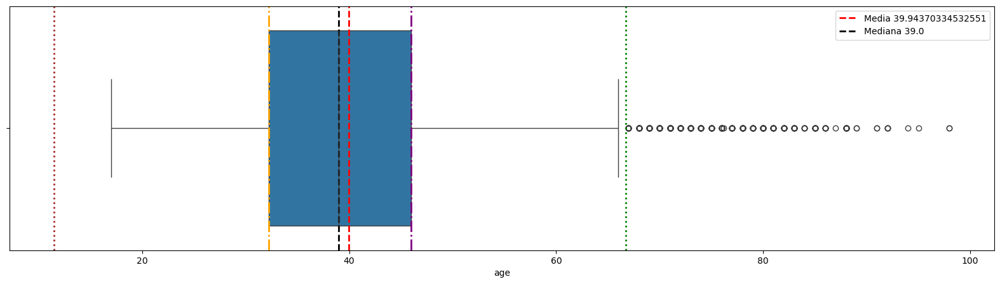

In [61]:
plt.figure(figsize=(20,5))
q1 = np.percentile(df['age'], 25)
q3 = np.percentile(df['age'], 75)
mediana = df['age'].median()
media = df['age'].mean()
IQR = q3 - q1

bigote_inferior = q1 - 1.5 * IQR
bigote_superior = q3 + 1.5 * IQR

sns.boxplot(data=df, x = 'age')
plt.axvline(media, color = 'red', linestyle = '--', linewidth = 2, label = f'Media {media}')
plt.axvline(mediana, color = 'black', linestyle = '--', linewidth = 2, label = f'Mediana {mediana}')
plt.axvline(q1, color = 'orange', linestyle = '-.',linewidth = 2)
plt.axvline(q3, color = 'purple', linestyle = '-.', linewidth = 2)
plt.axvline(bigote_inferior, color = 'brown', linestyle = ':',linewidth = 2)
plt.axvline(bigote_superior, color = 'green', linestyle = ':',linewidth = 2)

plt.legend();

# Estadística descriptiva 

## **<u>¿Qué es la estadística?</u>**

La estadística es una herramienta que nos ayuda a responder preguntas, resolver problemas y tomar decisiones basadas en información real, y no solo en lo que pensamos o suponemos.



<u> Estadística Descriptiva y Estadística Inferencial </u>

La estadística, como ya dijimos, nos ayuda a entender los datos. Pero dentro de la estadística hay dos "superpoderes" principales que usamos para trabajar con esa información: la estadística descriptiva y la estadística inferencial.

**- Estadística descriptiva**: Resumir y contar historias con los datos.

Organizamos, resumimos y mostramos los datos tal como son, para que sea más fácil entenderlos. Pero solo estamos contando lo que ya tenemos, no sacamos conclusiones más allá. DESCRIBIMOS nuestros datos. 

**- Estadística inferencial:** 

Estadística inferencial va más allá: utiliza una muestra para inferir conclusiones sobre una población y, en muchos casos, estimar valores futuros o no observados.

Esto se logra mediante herramientas como:

- Estimación (puntual e intervalos de confianza).

- Pruebas de hipótesis.

- Modelos probabilísticos y de regresión, que permiten predecir valores futuros bajo ciertas condiciones.

# 9.1. Estadística descriptiva

### ¿Qué es la estadística descriptiva?

La estadística descriptiva es una rama de la estadística que se centra en la recopilación, organización, resumen y presentación de datos de manera informativa y comprensible. Su objetivo principal es describir y resumir características esenciales de un conjunto de datos, lo que permite obtener una comprensión inicial y visual de la información contenida en los datos.

La estadística descriptiva es útil para un analista de datos por varias razones:

1. **Resumen de Datos**: Permite resumir grandes conjuntos de datos en medidas clave, como la media (promedio), la mediana, la moda, la varianza y la desviación estándar. Estas medidas proporcionan una visión general de la distribución y tendencias de los datos.
2. **Visualización de Datos**: Facilita la creación de gráficos y visualizaciones que ayudan a representar los datos de manera efectiva. Los gráficos permiten identificar patrones, tendencias y valores atípicos en los datos.
3. **Identificación de Valores Atípicos**: Ayuda a detectar valores atípicos o outliers en los datos, que pueden ser indicativos de errores o eventos inusuales que requieren atención.
4. **Exploración de Relaciones**: Permite explorar relaciones entre variables, como la correlación entre dos conjuntos de datos, lo que ayuda a entender cómo interactúan diferentes factores.
5. **Toma de Decisiones Informadas**: La estadística descriptiva proporciona información objetiva y basada en datos que respalda la toma de decisiones informadas. Permite evaluar la calidad de los datos y comprender mejor el contexto en el que se recopilaron.

### Tipos de medidas en estadística descriptiva

En estadística descriptiva, las medidas se pueden clasificar en tres categorías principales según el aspecto del conjunto de datos que describen:

1. **Medidas de Centralización:** Estas medidas se utilizan para describir el valor central o típico de un conjunto de datos. Las medidas de centralización incluyen:
   * **Media (Promedio):** Representa el valor promedio de los datos.
   * **Mediana:** Es el valor que se encuentra en el medio de los datos cuando están ordenados.
   * **Moda:** Es el valor que aparece con mayor frecuencia en el conjunto de datos.
2. **Medidas de Dispersión:** Estas medidas indican cuán dispersos o agrupados están los datos alrededor de la medida de centralización. Las medidas de dispersión incluyen:
   * **Varianza:** Mide la dispersión de los datos en relación con la media.
   * **Desviación Estándar:** Es la raíz cuadrada de la varianza y proporciona una medida de dispersión en la misma unidad que los datos.
   * **Rango:** Es la diferencia entre el valor máximo y el valor mínimo en el conjunto de datos.
3. **Medidas de Forma:** Estas medidas describen la forma de la distribución de los datos. Algunas medidas de forma incluyen:
   * **Asimetría** Indica si la distribución de los datos está sesgada hacia la izquierda o hacia la derecha.
   
   ![Distribucion sesgada a la derecha.png](<attachment:Distribucion sesgada a la derecha.png>) ![Distribucion sesgada a la izquierda-1.png](<attachment:Distribucion sesgada a la izquierda-1.png>)![Distribucion simetrica.png](<attachment:Distribucion simetrica.png>)

   * **Curtosis:** Mide la concentración de datos en la región central de la distribución.

   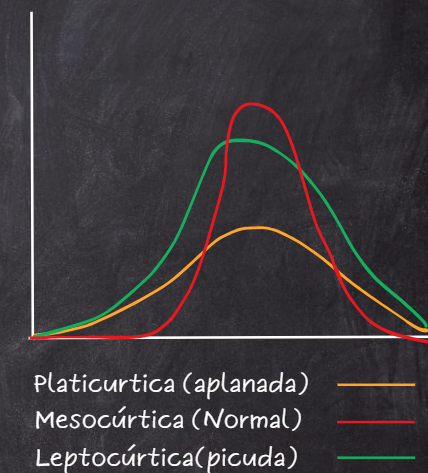 

Además de estas medidas, que son las principales, otras altamente usadas en el mundo del análisis de datos son:

4. **Medidas de Correlación**: Estas medidas se utilizan para cuantificar la relación entre dos o más variables. Algunas de las medidas de correlación más comunes son el coeficiente de correlación de Pearson (para variables numéricas), el coeficiente de correlación de Spearman (para variables ordinales) y el coeficiente de contingencia (para variables categóricas).
5. **Medidas de Resumen Categóricas**: Estas medidas se utilizan para resumir y describir datos categóricos o cualitativos, es decir, datos que representan categorías o grupos en lugar de valores numéricos. Un ejemplo de este tipo de medida son las tablas de frecuencias.
6. **Medidas de Posición Relativa**: Estas medidas se utilizan para determinar la posición de un valor en relación con otros valores en una distribución. Ejemplos incluyen los percentiles, los cuartiles y los deciles.


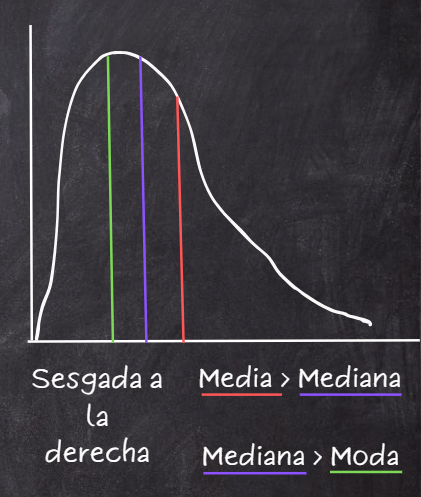
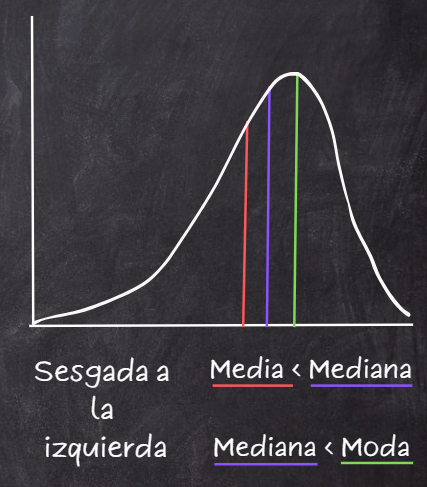
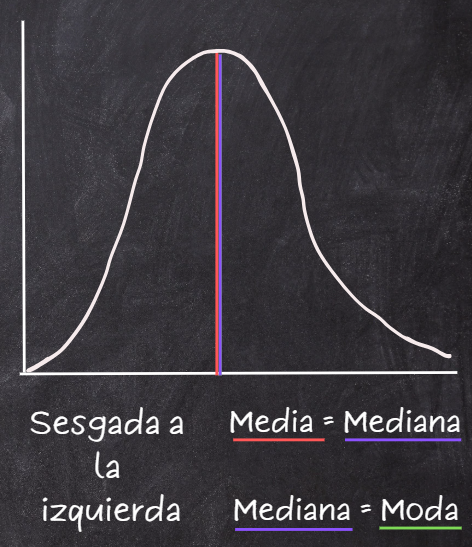

# 9.2 Medidas de centralización

**Las medidas de centralización** son un conjunto de herramientas que utilizamos en estadística para responder a una pregunta muy común: "¿Dónde se agrupa la mayoría de los datos en una distribución.?"

Hay tres medidas de centralización principales:

| Concepto         | Definición                                                                                                                                                                                                                                                                                 | Ejemplo aplicado al análisis de datos                                                                 |
| ---------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------ | ----------------------------------------------------------------------------------------------------- |
| **Media (Promedio)** | La media es el valor promedio de un conjunto de datos. Se calcula sumando todos los valores y dividiéndolos por el número de observaciones.                                                                                                                                                | En un conjunto de calificaciones de estudiantes, la media representa el rendimiento académico promedio. |
| **Mediana**      | La mediana es el valor que se encuentra en el medio de un conjunto de datos ordenados. Si el conjunto tiene un número impar de observaciones, la mediana es el valor central. Si el conjunto tiene un número par de observaciones, la mediana es el promedio de los dos valores centrales. | En el análisis de salarios de una empresa, la mediana indica el salario típico de los empleados.        |
| **Moda**         | La moda es el valor que aparece con mayor frecuencia en un conjunto de datos. Puede haber una moda (un valor más común) o múltiples modas (varios valores con la misma frecuencia máxima).                                                                                                 | En el análisis de preferencias de productos, la moda identifica el producto más popular entre los consumidores. |



# Medidas de centralización



## Media

Para calcular la media usaremos el método `.mean()` de Pandas. Aquí está la sintaxis básica del método `.mean()`:

```python
df['Nombre_de_Columna'].mean()
```

Donde:

* `df`: Es el DataFrame en el que deseas calcular la media.
* `'Nombre_de_Columna'`: Es el nombre de la columna para la cual dese as calcular la media.

Formula matemática:

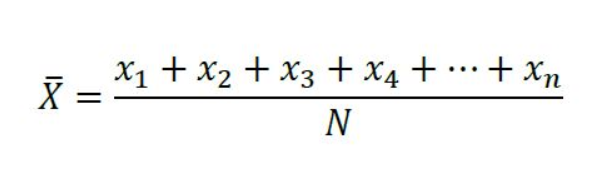

Ejemplo:

![Media ejemplo.png](<attachment:Media ejemplo.png>)




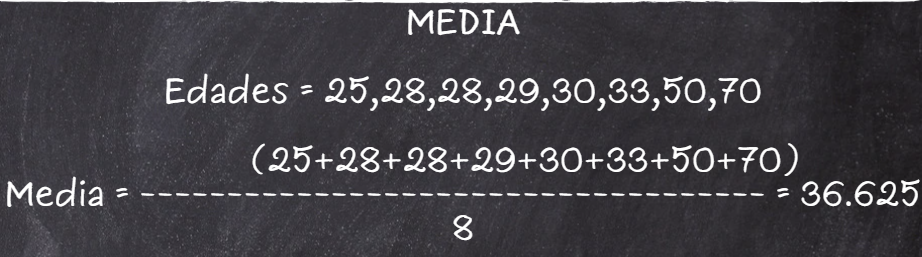

In [62]:
# Calculamos la media de los ingresos de los clientes.
media_income = round(df['income'].mean(),2)

In [63]:
# Calculamos la media de edad de los clientes.
media_age = round(df['age'].mean(),2)
media_age

39.94

## MEDIANA

Para calcular la mediana usaremos el método `.median()`. Aquí está la sintaxis básica del método `.median()`:

```python
df['Nombre_de_Columna'].median()
```

Donde:

* `df`: Es el DataFrame en el que deseas calcular la mediana.
* `'Nombre_de_Columna'`: Es el nombre de la columna para la cual deseas calcular la mediana.

Formula matemática:

impar:

![mediana impar.png](<attachment:mediana impar.png>)

par:

![mediana par.png](<attachment:mediana par.png>)

Ejemplos:

impar:

![Mediana impar ejemplo.png](<attachment:Mediana impar ejemplo.png>)

par:

![Mediana par ejemplo.png](<attachment:Mediana par ejemplo.png>)
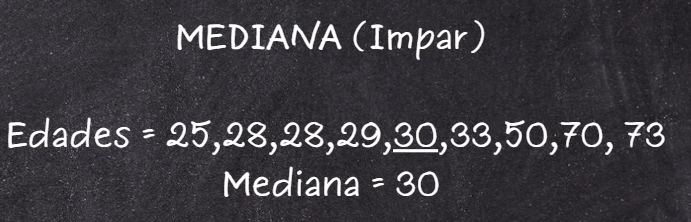
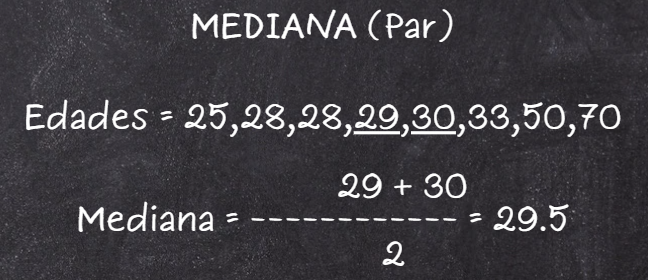
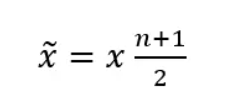
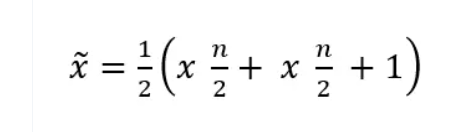

In [64]:
#  Calculamos la mediana de los ingresos de los clientes.

mediana_income = df['income'].median()
mediana_income


93050.5

**Entonces, ¿Cuál es la diferencia entre media y mediana?**

1. **Media de los Ingresos:** La media de los ingresos de los clientes es aproximadamente 93241.2$ 
Esto significa que si sumamos todos los ingresos de los clientes y luego dividimos ese total por la cantidad de clientes, obtendríamos alrededor de 93241.2$. 
Es como si estuviéramos repartiendo equitativamente el dinero entre todos los clientes, y cada uno recibiría alrededor de 93241.2 $.

2. **Mediana de los Ingresos:** La mediana de los ingresos de los clientes es aproximadamente 93050.5$. 
Imagina que hacemos una lista de todos los ingresos de los clientes en orden de menor a mayor. Luego, encontramos el ingreso que está justo en el medio de la lista. Ese valor es la mediana. En este caso, la mediana es 93050.5$. Esto significa que la mitad de los clientes tiene ingresos menores o iguales a 93050.5$, 
y la otra mitad tiene ingresos mayores o iguales a esa cantidad.

En resumen, la **media** es el promedio de todos los ingresos y puede verse afectada por valores extremos, mientras que la **mediana** es el ingreso que se encuentra justo en el medio cuando los ingresos se ordenan, y no se ve influenciada por valores extremos. Ambas medidas son importantes para entender la distribución de los ingresos de los clientes.


In [65]:
# Calculamos la mediana de edad de los clientes.
mediana_age = df['age'].median()
mediana_age

39.0

In [66]:
edad = np.array([12,15,18,22,64])
serie_edad = pd.Series(edad)

serie_edad.median()

18.0

In [67]:
serie_edad

0    12
1    15
2    18
3    22
4    64
dtype: int32

Para visualizar la mediana, podemos utilizar un diagrama de caja (*boxplot*) que muestra la distribución de los datos y resalta la mediana junto con los cuartiles (que aprenderemos que son a lo largo de esta lección).


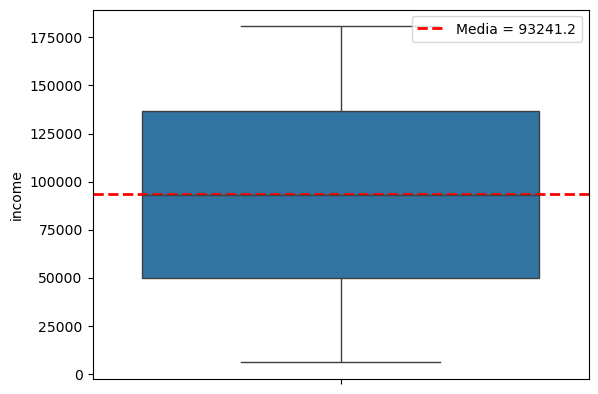

In [68]:
# MEDIANA -- > BOXPLOT 
# PODEMOS AÑADIR MEDIA PARA COMPARAR

sns.boxplot(data=df, y = 'income')
media_income
plt.axhline(media_income, color = 'red', linestyle = '--', linewidth = 2, label = f"Media = {media_income}")
plt.legend();



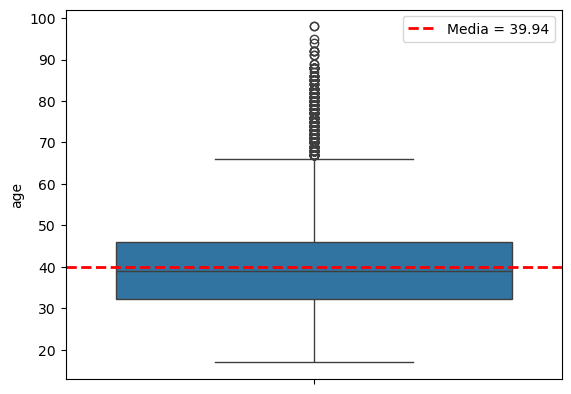

In [69]:
sns.boxplot(data=df, y = 'age')
media_age
plt.axhline(media_age, color = 'red', linestyle = '--', linewidth = 2, label = f"Media = {media_age}")
plt.legend();


Este gráfico de caja proporcionará una representación visual de la mediana de ingresos, así como información sobre la dispersión de los datos en esa columna.

Para la mediana de edad, podéis seguir el mismo enfoque y crear un diagrama de caja similar, cambiando `'income'` por `'age'` en el código anterior y viendo los resultados. 

## Moda

Para calcular la moda usaremos el método `.mode()`. La sintaxis básica del método `.mode()`:

```python
df['Nombre_de_Columna'].mode()
```

Donde:

* `df`: Es el objeto DataFrame en el que deseas calcular la moda.
* `'Nombre_de_Columna'`: Es el nombre de la columna para la cual deseas calcular la moda.

Ejemplo:

![Moda ejemplo.png](<attachment:Moda ejemplo.png>)


**Es importante tener en cuenta que la moda puede devolver múltiples valores si hay más de un valor que se repite con la misma frecuencia máxima en la serie.**
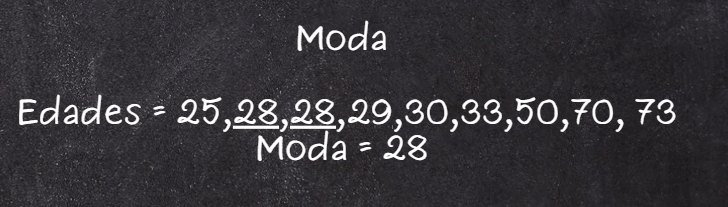

In [70]:
#  Calculamos la moda de la educación de los clientes.

moda_education = df['education'].mode()[0]
moda_education

'university degree'

In [71]:
# Calculamos la moda del trabajo.

moda_job = df['job'].mode()[0]
moda_job



'admin.'

Las dos formas comunes de visualizar la moda en Seaborn, dependiendo de si estás trabajando con variables categóricas o numéricas.

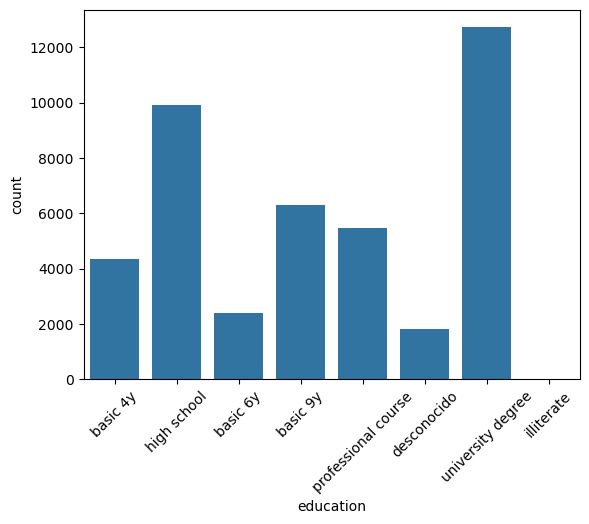

In [72]:
# MODA VARIABLES CATEGORICAS --> COUNTPLOT EDUCATION/JOB

sns.countplot(data=df, x = 'education')
plt.xticks(rotation = 45);

In [73]:
mode_age = df['age'].mode()[0]
mode_age

31.0

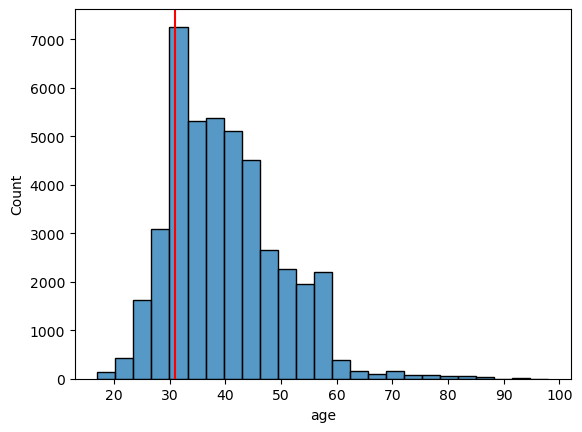

In [74]:
# MODA VARIABLES NUMERICAS DISCRETAS CON MUCHAS CATEGORIAS O CONTINUAS  --> 'histplot()'

sns.histplot(data=df, x = 'age', bins = 25)
plt.axvline (mode_age, color = 'red');



# 9.3 Medidas de dispersión

**Las medidas de dispersión** son una parte importante de la estadística que nos ayudan a comprender cuán extendidos o agrupados están los datos en un conjunto. Mientras que las medidas de tendencia central (como la media, la mediana y la moda) nos dicen dónde se encuentra el valor promedio de nuestros datos, las medidas de dispersión nos indican cuánto se separan o dispersan esos datos alrededor de ese valor promedio.

Aquí tienes las dos medidas de dispersión fundamentales:


| Concepto            | Definición                                                                                                                                                       | Ejemplo Aplicado al Análisis de Datos                                                                                                                  | Interpretación                                                                                                                                                        |
| ------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------ | --------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| Varianza            | La varianza mide la dispersión o variabilidad de un conjunto de datos. Se calcula como la media de los cuadrados de las diferencias entre cada valor y la media. | Al analizar los tiempos de respuesta de un sitio web, la varianza indica cuánto varían los tiempos respecto a la media.                                | Una varianza alta en los tiempos de respuesta indica una gran variabilidad, lo que puede afectar negativamente la experiencia del usuario.                            |
| Desviación Estándar | La desviación estándar es la raíz cuadrada de la varianza y proporciona una medida de la dispersión en la misma unidad que los datos originales.                 | En la investigación de mercado, la desviación estándar de las edades de los consumidores puede indicar la dispersión de edades en un mercado objetivo. | Una desviación estándar baja significa que la mayoría de los consumidores tienen edades similares, mientras que una alta indica una mayor variabilidad en las edades. |



## Varianza

Para calcular la varianza usaremos el método `.var()`. La sintaxis básica:

```python
df['Nombre_de_Columna'].var()
```

Donde:

* `df`: Es el DataFrame en el que deseas calcular la varianza.
* `'Nombre_de_Columna'`: Es el nombre de la columna para la cual deseas calcular la varianza.

Formula matemática:

![formula varianza.png](<attachment:formula varianza.png>)

Ejemplo:

![ejemplo varianza.png](<attachment:ejemplo varianza.png>)


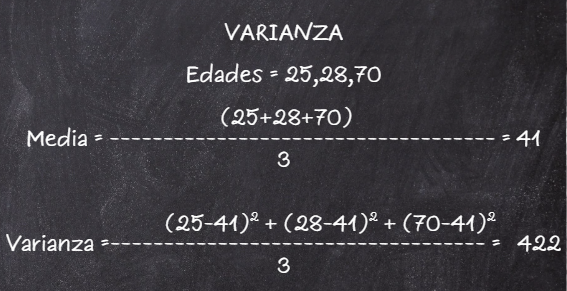
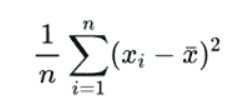

In [75]:
# Vamos a calcular la varianza de los ingresos de los clientes.
# La varianza de los ingresos nos indica cuán dispersos están los ingresos de los clientes alrededor de su valor promedio. 
# Si la varianza es alta, significa que los ingresos varían mucho de un cliente a otro. Si es baja, los ingresos son más consistentes.

var_income = round(df['income'].var(),2)
var_income


2550079937.2

In [76]:
#  Calcularemos la varianza de las edades de los clientes.
# Interpretación: La varianza de las edades nos dice cuán dispersas están las edades de los clientes alrededor de su edad promedio. 
# Si la varianza es alta, significa que las edades varían considerablemente. Si es baja, las edades son más similares entre los clientes.

var_age = round(df['age'].var(), 2)
var_age


98.55

**¿Cómo interpretamos conjuntamente la media, mediana y varianza?**

1. **Media (Promedio): 39.98**

   - La media es el promedio de todas las edades en el conjunto de datos. Se calcula sumando todas las edades y dividiendo por el número total de clientes.

   - En este caso, la media de edad nos da una idea general de cuál es la "edad promedio" en el conjunto de clientes. Es el valor promedio que se obtendría si se distribuyeran equitativamente las edades entre todos los clientes.

2. **Mediana (Valor del medio): 38**

   - La mediana es el valor que se encuentra justo en el medio de la lista de edades cuando estas se ordenan de menor a mayor.

   - En este caso, la mediana de edad es 38, lo que significa que la mitad de los clientes tienen edades iguales o inferiores a este valor y la otra mitad tiene edades iguales o superiores a este valor. La mediana es útil cuando hay valores extremadamente altos o bajos que pueden afectar la media.

3. **Varianza: 108.95**
   - La varianza es una medida de la dispersión de las edades alrededor de la media. Es una medida de cuán dispersas están las edades en el conjunto de datos.
   
   - En este caso, una varianza de 108.95 indica que las edades tienden a variar relativamente mucho alrededor de la media. Cuanto menor sea la varianza, menor será la dispersión de las edades, lo que sugiere que la mayoría de los clientes tienen edades cercanas a la media y que no hay valores extremadamente alejados de esta.

---------

Para visualizar la varianza, una buena opción es un histograma, que mostrará cómo se distribuyen los datos alrededor de la media. Sin embargo, la varianza en sí misma no se representa directamente en un gráfico, ya que es una medida numérica. Aquí tienes un ejemplo de cómo visualizar la varianza de las edades utilizando un histograma:


Este histograma te mostrará cómo se distribuyen las edades de los clientes y te ayudará a entender la varianza en el contexto de la distribución de edades.

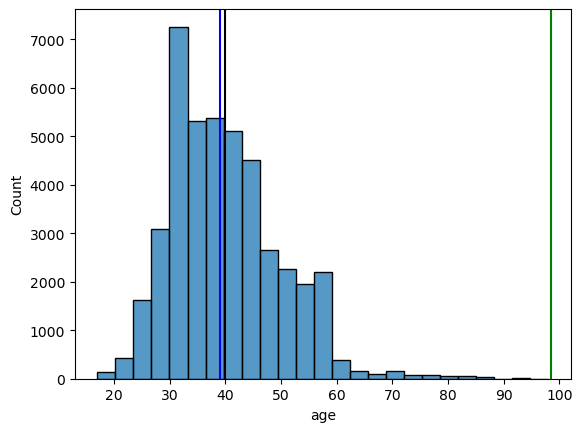

In [77]:
# VARIANZA --> HISTOGRAMA (AGE)



sns.histplot(data=df, x = 'age', bins = 25)


plt.axvline(media_age, color = 'black')
plt.axvline(var_age, color = 'green')
plt.axvline(mediana_age, color = 'blue');

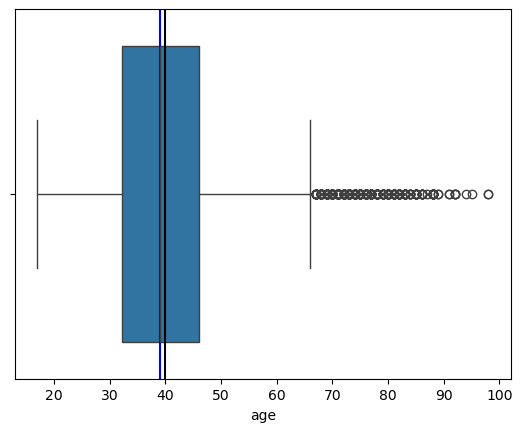

In [78]:
sns.boxplot(data=df, x = 'age')


plt.axvline(media_age, color = 'black')

plt.axvline(mediana_age, color = 'blue');

## Desviación estándar

En este caso usaremos el método `std()` de Pandas. La sintaxis básica del método `.std()`:

```python
df['Columna'].std()
```

Donde:

* `df`: Es el DataFrame o la Serie en el que deseas calcular la desviación estándar.
* `'Columna'`: Es el nombre de la columna para la cual deseas calcular la desviación estándar.

La desviación estándar es una medida importante de dispersión que se usa comúnmente en estadísticas para comprender cuánto varían los datos. Cuanto mayor sea la desviación estándar, mayor será la dispersión de los valores en relación con la media.

Formula matemática:

![formula desviacion tipica.png](<attachment:formula desviacion tipica.png>)

Ejemplo:

![Ejemplo desviacion estandar.png](<attachment:Ejemplo desviacion estandar.png>)

* **Gráfica Sugerida:** Un histograma o un gráfico de densidad de las edades puede ayudar a visualizar cómo se distribuyen las edades y cuán dispersas están alrededor de la media.

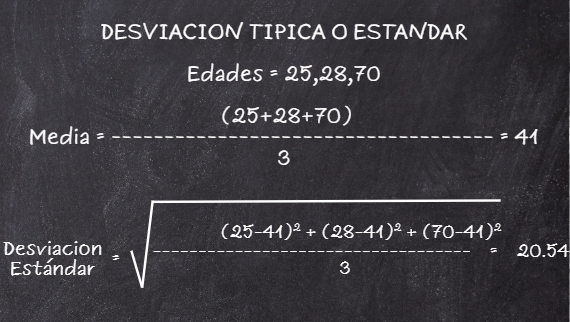
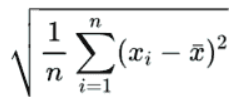

In [79]:
# Calcularemos la desviación estándar de los Ingresos
# Interpretación: La desviación estándar de los ingresos mide cuánto varían los ingresos de los clientes respecto a la media. 
# En este caso, una desviación estándar más alta indicaría que los ingresos están más dispersos alrededor de la media, mientras 
# que una desviación estándar más baja indicaría que los ingresos son más consistentes y tienden a estar más cerca de la media.

std_income = round(df['income'].std(),2)
std_income

50498.32

In [80]:
# Calculamos la desviación estándar de la Edad:
# Interpretación: La desviación estándar de las edades mide cuánto varían las edades de los clientes respecto a la media de las edades. 
# Una desviación estándar más alta indicaría una mayor dispersión de las edades alrededor de la media, mientras que una desviación estándar 
# más baja indicaría que las edades son más consistentes y tienden a estar más cerca de la media

std_age = round(df['age'].std(),2)
std_age

9.93

**¿Cómo interpretamos todas las medidas que hemos visto a la vez?**


1. **Media (Promedio): 39.98**
   - La media es el promedio de todas las edades en el conjunto de datos. Se calcula sumando todas las edades y dividiendo por el número total de clientes.
   - En este caso, la media de edad nos da una idea general de cuál es la "edad promedio" en el conjunto de clientes.

2. **Mediana (Valor del Medio): 38**
   - La mediana es el valor que se encuentra justo en el medio de la lista de edades cuando estas se ordenan de menor a mayor.
   - La mediana es útil cuando hay valores extremadamente altos o bajos que pueden afectar la media. En este caso, significa que la mitad de los clientes tienen edades iguales o inferiores a 38 y la otra mitad tiene edades iguales o superiores a este valor.

3. **Varianza: 108.95**
   - La varianza es una medida de la dispersión de las edades alrededor de la media. Es una medida de cuán dispersas están las edades en el conjunto de datos.
   - En este caso, una varianza de 108.95 indica que las edades tienden a variar relativamente mucho alrededor de la media. Cuanto mayor sea la varianza, mayor será la dispersión de las edades alrededor de la media.

4. **Desviación Estándar: 10.44**
   - La desviación estándar es simplemente la raíz cuadrada de la varianza. Es una medida de dispersión que tiene las mismas unidades que la variable original (en este caso, años).
   - Una desviación estándar más baja indica que las edades tienden a estar más cerca de la media, mientras que una desviación estándar más alta indica que las edades están más dispersas alrededor de la media.

En resumen, la media nos da el valor promedio, la mediana nos muestra el valor del medio, la varianza nos dice cuánto se dispersan las edades, y la desviación estándar nos proporciona una medida de dispersión que tiene las mismas unidades que la variable original. Cada una de estas medidas aporta información diferente sobre la distribución de las edades en el conjunto de datos.

In [81]:
df['age'].describe()

count    43000.000000
mean        39.943703
std          9.927421
min         17.000000
25%         32.200000
50%         39.000000
75%         46.000000
max         98.000000
Name: age, dtype: float64

In [82]:
# RANGO 

rango = df['age'].max() - df['age'].min()
rango

81.0

# 9.4 Medidas de correlación

La correlación es una forma de medir si dos cosas están relacionadas. Por ejemplo, ¿alguna vez te has preguntado si cuando hace calor, se venden más helados? La correlación nos ayuda a responder preguntas como esta y a descubrir conexiones entre diferentes variables.

**¿Por qué son importantes?**

Entender la correlación puede ser muy útil en situaciones cotidianas y también en el mundo del análisis de datos. Nos permite responder preguntas como:

* ¿Las ventas de helados suben cuando la temperatura aumenta?
* ¿Las horas de estudio están relacionadas con las calificaciones en los exámenes?

Conocer estas relaciones nos ayuda a tomar decisiones basadas en datos y entender mejor el mundo que nos rodea.

### Tipos de correlación:

Existen tres tipos principales de correlación:

1. **Correlación Positiva:** Cuando una variable aumenta, la otra también aumenta. Ejemplo: A mayor temperatura, más ventas de helados..
2. **Correlación Negativa:** Cuando una variable aumenta, la otra disminuye. Ejemplo: A mayor precio de un producto, menos personas lo compran.
3. **Sin correlación:** Cuando no hay una relación clara entre dos variables. Ejemplo: El número de zapatos vendidos no tiene relación con el clima

### Cómo medir la correlación

La medida más común para la correlación es el coeficiente de correlación (r). Este coeficiente nos indica la fuerza y dirección de la relación entre dos variables. Los valores de r se interpretan así:

* Cercano a 1: Correlación positiva fuerte (cuando una variable sube, la otra también sube).
* Cercano a -1: Correlación negativa fuerte (cuando una variable sube, la otra baja)
* Cercano a 0: No hay relación clara entre las variables

**Cómo saber la relación entre tus datos**

Antes de calcular la correlación, es importante entender el tipo de relación que pueden tener tus datos. Para ello puedes usar gráficos como el diagrama de dispersión, que te ayudará a visualizar la relación entre dos variables:

1. Usa un gráfico de dispersión para observar cómo se distribuyen los puntos. Por ejemplo:
   * En una relación lineal, los puntos forman aproximadamente una línea recta.
   * En una relación monotónica, los puntos tienden a aumentar o disminuir juntos, aunque no formen una línea recta.

> Ejemplo de código para crear un gráfico de dispersión en Python:

```python
  import matplotlib.pyplot as plt
  
  # Crear un gráfico de dispersión
  plt.scatter(df["temperatura"], df["ventas_helados"])
  plt.xlabel("Temperatura")
  plt.ylabel("Ventas de Helados")
  plt.title("Relación entre Temperatura y Ventas de Helados")
  plt.show()
```

2. Identifica patrones:
   * Si ves una línea ascendente o descendente, podría haber una relación lineal.
   * Si los datos muestran una tendencia general pero no constante, puede ser una relación monotónica.
3. Analiza los valores atípicos:
   * Los valores atípicos pueden distorsionar el cálculo de la correlación, especialmente para el método de Pearson. Hay que visualizar los datos para identificar y decidir si es necesario eliminarlos.

### Midiendo la correlación en Python\*\*

Para calcular la correlación en Pandas usamos el métdo `.corr()`. Aquí está la sintaxis básica:

```python
correlation_matrix = df.corr(method, min_periods, dropna, numeric_only)
```

**Parámetros del método .corr()**

* method: Determina el tipo de correlación (‘pearson’, ‘kendall’ o ‘spearman’).
* min\_periods: Especifica el número mínimo de datos necesarios para calcular la correlación.
* dropna: Controla si se excluyen los valores NaN antes del cálculo (por defecto, True).
* numeric\_only: Calcula la correlación solo entre columnas numéricas.

**¿Cuándo usar cada método de correlación?** En el parámetro "method" hemos visto que hay varias opciones, pero entendamos que significa cada una de ellas. Existen varios métodos para calcular la correlación dependiendo del tipo de datos y de la relación que esperemos encontrar:

1. **Correlación de Pearson**:
   * Mide la relación lineal entre dos variables.
   * Detecta **únicamente relaciones lineales**, es decir, cuando el cambio en una variable se relaciona directamente con el cambio en la otra de manera constante.
   * Sensible a valores atípicos (outliers) que pueden distorsionar los resultados.
   * Se utiliza cuando se espera que las variables tengan una relación lineal, como la altura y el peso de las personas.
2. **Correlación de Spearman**:
   * Mide la correlación basada en los rangos de los datos.
   * Detecta relaciones monotónicas, es decir, cuando las variables tienden a aumentar o disminuir juntas, pero no necesariamente de manera constante.
   * A menudo se utiliza cuando se quiere evaluar la relación entre dos variables ordinales (datos que se pueden ordenar pero no necesariamente tienen una escala numérica) o cuando se sospecha que la **relación es no lineal**.
   * Se usa en situaciones donde los valores de las variables no tienen un significado numérico directo, como la calificación de películas por parte de espectadores.
3. **Correlación de Kendall**:
   * Mide la correlación basada en el orden o los rangos de los datos.
   * Detecta relaciones monotónicas, al igual que la correlación de Spearman.
   * Robusta frente a valores atípicos y adecuada cuando no se conoce la forma específica de la relación entre las variables.
   * Se utiliza en situaciones donde se quiere evaluar si hay una relación de orden entre variables, como la clasificación de productos según la preferencia de los consumidores.

**Cuándo usar cada método**

* **Pearson**: Cuando esperas una relación lineal y los datos no tienen muchos valores atípicos.
* **Spearman**: Cuando esperas una relación monotónica o trabajas con datos ordinales.
* **Kendall**: Cuando necesitas una métrica robusta a valores atípicos o quieres evaluar el orden.

Podemos calcular la correlación de manera sencilla usando Python y la librería Pandas:

```python
import pandas as pd

# Crear un DataFrame con datos de ejemplo
data = {
    "temperatura": [20, 25, 30, 35, 40],
    "ventas_helados": [200, 250, 300, 350, 400]
}
df = pd.DataFrame(data)

# Calcular la correlación
correlacion = df.corr()
print(correlacion)
```

La salida esperada es la siguiente:

```
                temperatura  ventas_helados
temperatura         1.000          1.000
ventas_helados      1.000          1.000
```

Esto nos indica que la correlación entre la temperatura y las ventas de helados es positiva y fuerte (r = 1). Es decir, cuando la temperatura sube, las ventas de helados también suben.

In [84]:
data = {
    "temperatura": [20, 25, 30, 35, 40],
    "ventas_helados": [200, 250, 300, 350, 400]
}
df_helados = pd.DataFrame(data)

# Calcular la correlación
correlacion = df_helados.corr()
print(correlacion)

                temperatura  ventas_helados
temperatura             1.0             1.0
ventas_helados          1.0             1.0


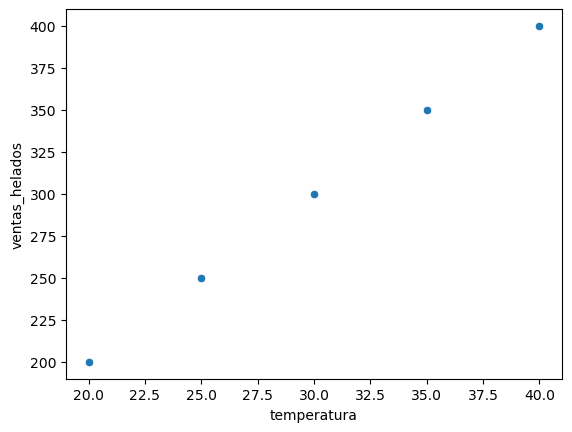

In [85]:
sns.scatterplot(data = df_helados, x = 'temperatura', y = 'ventas_helados');

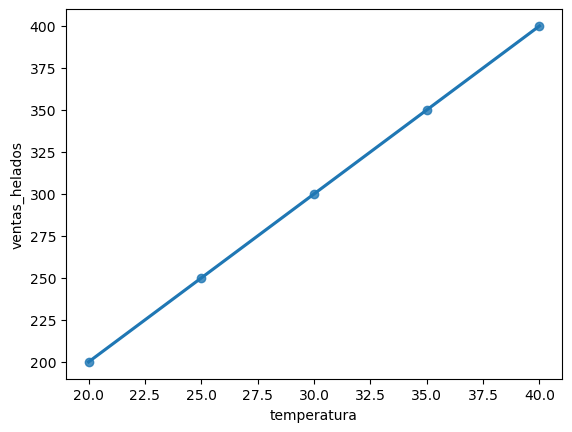

In [86]:
sns.regplot(data = df_helados, x = 'temperatura', y = 'ventas_helados');

# Medidas de correlación




In [89]:
# combinations, para hacer scatter de todas las numéricas y ver posibles pares y combinaciones

from itertools import combinations

numericas = df.select_dtypes(include=np.number)
numericas_comb = list(combinations(numericas, 2))
numericas_comb

[('income', 'kidhome'),
 ('income', 'teenhome'),
 ('income', 'numwebvisitsmonth'),
 ('income', 'duration'),
 ('income', 'campaign'),
 ('income', 'previous'),
 ('income', 'emp var rate'),
 ('income', 'cons price idx'),
 ('income', 'cons conf idx'),
 ('income', 'nr employed'),
 ('income', 'latitude'),
 ('income', 'longitude'),
 ('income', 'age'),
 ('income', 'euribor3m'),
 ('kidhome', 'teenhome'),
 ('kidhome', 'numwebvisitsmonth'),
 ('kidhome', 'duration'),
 ('kidhome', 'campaign'),
 ('kidhome', 'previous'),
 ('kidhome', 'emp var rate'),
 ('kidhome', 'cons price idx'),
 ('kidhome', 'cons conf idx'),
 ('kidhome', 'nr employed'),
 ('kidhome', 'latitude'),
 ('kidhome', 'longitude'),
 ('kidhome', 'age'),
 ('kidhome', 'euribor3m'),
 ('teenhome', 'numwebvisitsmonth'),
 ('teenhome', 'duration'),
 ('teenhome', 'campaign'),
 ('teenhome', 'previous'),
 ('teenhome', 'emp var rate'),
 ('teenhome', 'cons price idx'),
 ('teenhome', 'cons conf idx'),
 ('teenhome', 'nr employed'),
 ('teenhome', 'latitud

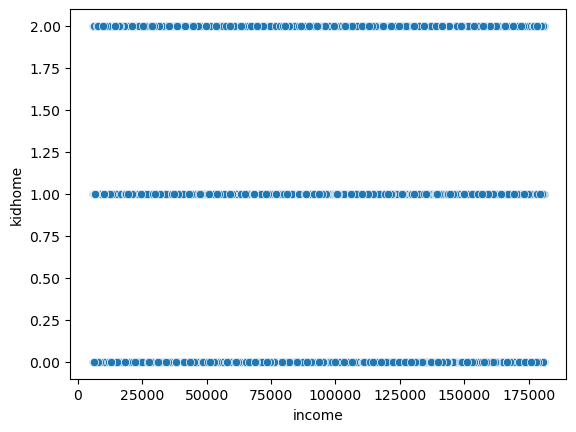

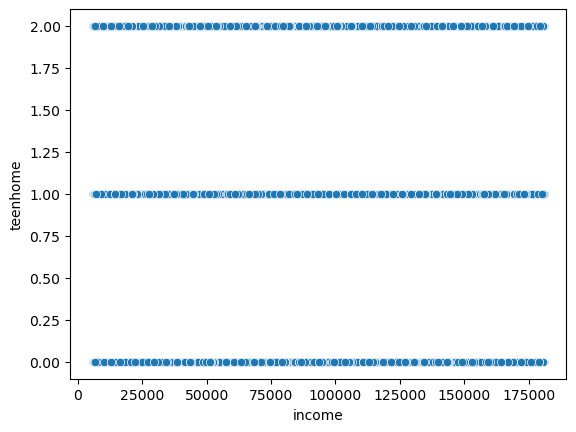

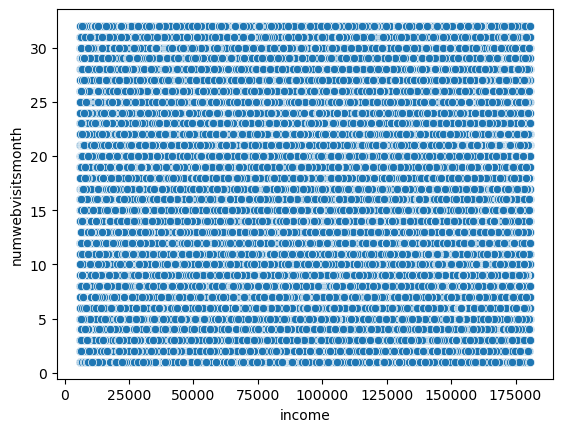

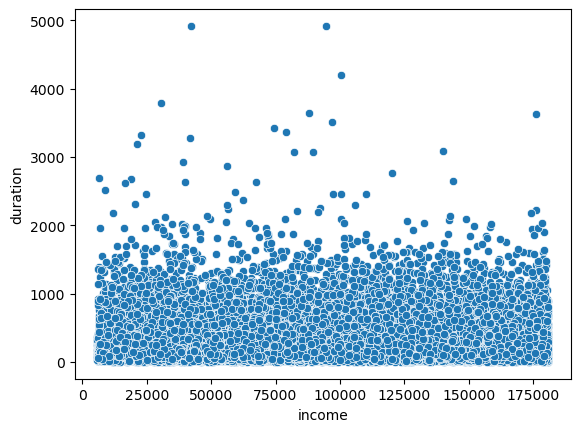

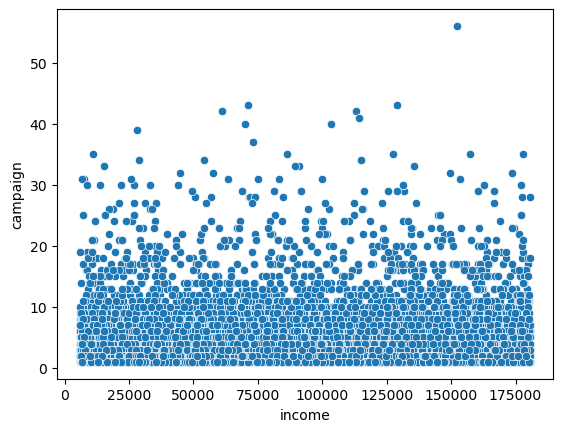

...

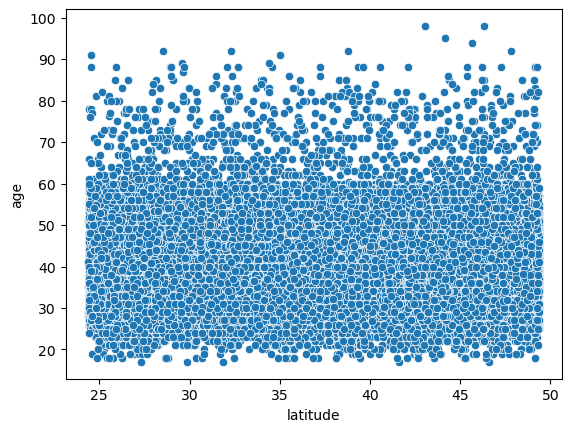

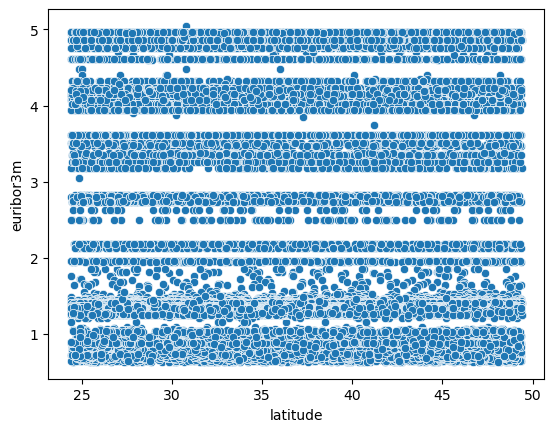

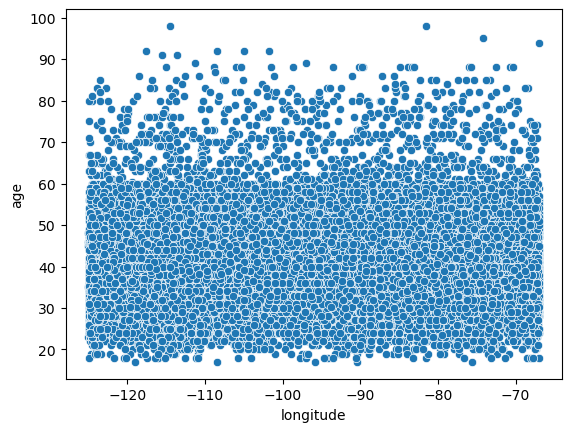

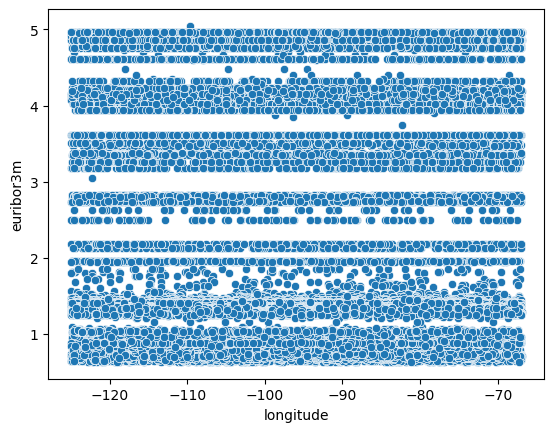

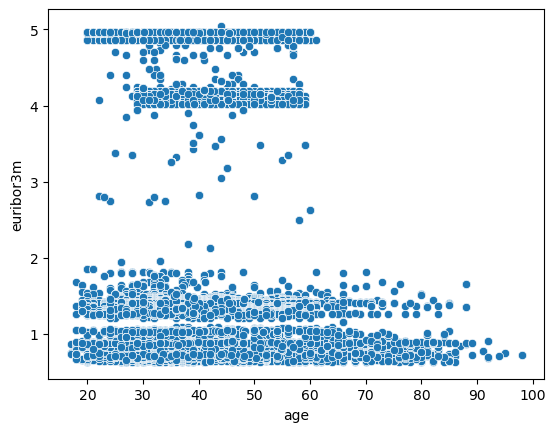

In [90]:
for col in numericas_comb:
    sns.scatterplot(data=df, x = col[0], y =col[1])
    plt.show();

Usaremos un gráfico de dispersión para observar cómo se distribuyen los puntos. Por ejemplo:
   - En una relación lineal, los puntos forman aproximadamente una línea recta.
   - En una relación monotónica, los puntos tienden a aumentar o disminuir juntos, aunque no formen una línea recta.

Para interpretarlos tener en cuenta:
   
   - Si ves una línea ascendente o descendente, podría haber una relación lineal.
   - Si los datos muestran una tendencia general pero no constante, puede ser una relación monotónica.



**No parece haber correlación entre las variables.**

In [91]:
# como todas las parejas de variables tienen relaciones no lineales, aplicaremos la correlación de Spearman a todo el DataFrame

matrix = numericas.corr()
matrix

,income,kidhome,teenhome,numwebvisitsmonth,duration,campaign,previous,emp var rate,cons price idx,cons conf idx,nr employed,latitude,longitude,age,euribor3m
income,1.000000,0.001350,0.006480,0.002500,-0.002761,-0.003736,-0.003207,-0.008640,-0.011102,0.001571,-0.003926,-0.004433,0.000360,0.002170,-0.004459
kidhome,0.001350,1.000000,-0.001352,-0.005629,-0.000759,-0.006733,-0.000851,-0.004026,0.001129,-0.002109,-0.007266,-0.002123,0.002349,0.001259,-0.004037
teenhome,0.006480,-0.001352,1.000000,-0.002803,-0.005937,0.000802,-0.003012,0.001431,0.004037,0.000989,-0.000756,-0.001514,-0.001410,-0.000179,-0.002791
numwebvisitsmonth,0.002500,-0.005629,-0.002803,1.000000,0.000750,0.004470,-0.001967,-0.006914,-0.004197,0.006740,-0.010101,0.002851,-0.002244,-0.004719,-0.004077
duration,-0.002761,-0.000759,-0.005937,0.000750,1.000000,-0.071956,0.021285,-0.027158,0.005825,-0.007631,-0.044157,-0.004131,0.003563,0.000022,-0.030369
campaign,-0.003736,-0.006733,0.000802,0.004470,-0.071956,1.000000,-0.079603,0.152084,0.127981,-0.012867,0.145089,-0.009589,-0.000568,0.003143,0.120181
previous,-0.003207,-0.000851,-0.003012,-0.001967,0.021285,-0.079603,1.000000,-0.419110,-0.199708,-0.048914,-0.501641,0.011632,-0.010392,0.028934,-0.396882
emp var rate,-0.008640,-0.004026,0.001431,-0.006914,-0.027158,0.152084,-0.419110,1.000000,0.771397,0.192004,0.907162,-0.008496,0.000301,-0.014046,0.841451
cons price idx,-0.011102,0.001129,0.004037,-0.004197,0.005825,0.127981,-0.199708,0.771397,1.000000,0.055530,0.519737,-0.004180,-0.003114,-0.006022,0.589144
cons conf idx,0.001571,-0.002109,0.000989,0.006740,-0.007631,-0.012867,-0.048914,0.192004,0.055530,1.000000,0.097433,-0.006520,0.007739,0.121936,0.229175


In [104]:
mascara = np.triu(np.ones_like(matrix, dtype=bool))

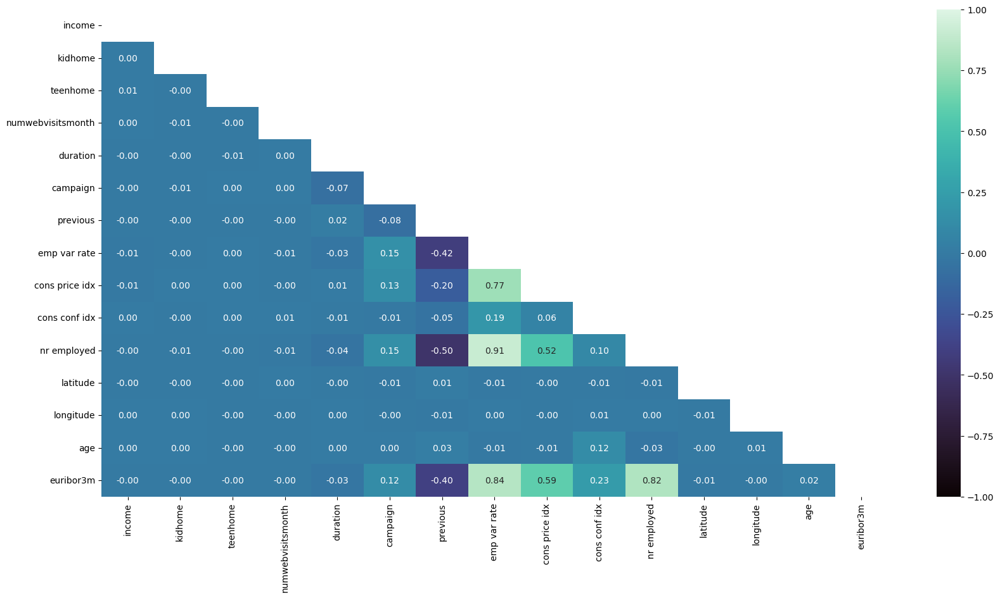

In [105]:
plt.figure(figsize=(20,10))
sns.heatmap(matrix, annot=True, fmt='.2f', cmap= 'mako', vmin=-1, vmax='1', mask = mascara);

**Interpretación de los resultados**

La fuerza de una correlación se evalúa en función del valor absoluto del coeficiente de correlación. Algunos criterios para decidir si la relación es fuerte, moderada o débil son: 

- **Correlación Débil**:

   - El valor absoluto del coeficiente de correlación está cerca de 0.

   - Por lo general, se considera una correlación débil si el valor absoluto está por debajo de 0.3.

- **Correlación Moderada**:

   - El valor absoluto del coeficiente de correlación está en el rango de 0.3 a 0.7.

   - Se considera una correlación moderada si el valor absoluto está en este rango.
   
-  **Correlación Fuerte**:

   - El valor absoluto del coeficiente de correlación es igual o superior a 0.7.

   - Se considera una correlación fuerte si el valor absoluto está en este rango.




1. **Income**: La variable "income" (ingresos) muestra una correlación positiva muy débil con la mayoría de las otras variables. Esto significa que no hay una relación fuerte y clara entre los ingresos y las demás variables. La correlación positiva sugiere que a medida que los ingresos aumentan ligeramente, algunas de las otras variables también tienden a aumentar ligeramente, pero la magnitud de esta relación es muy pequeña.

2. **Kidhome**: La variable "kidhome" (número de niños en el hogar) muestra correlaciones negativas débiles con algunas variables como "previous" (número de contactos previos), "euribor3m" (tasa de interés Euribor a 3 meses) y "pdays" (número de días desde el último contacto). Esto sugiere que a medida que el número de niños en el hogar aumenta ligeramente, algunas de estas variables tienden a disminuir ligeramente. Sin embargo, estas correlaciones también son bastante débiles.

3. **Teenhome**: La variable "teenhome" (número de adolescentes en el hogar) muestra correlaciones débiles y en su mayoría no significativas con las demás variables. Esto indica que el número de adolescentes en el hogar no está fuertemente relacionado con las otras variables en el conjunto de datos.

4. **Numwebvisitsmonth**: La variable "numwebvisitsmonth" (número de visitas mensuales a la página web) muestra correlaciones débiles y en su mayoría no significativas con otras variables. Esto sugiere que la cantidad de visitas a la página web no está fuertemente relacionada con las otras variables en el conjunto de datos.

5. **Duration**: La variable "duration" (duración del contacto) muestra una correlación negativa moderada con "empvarrate" (tasa de variación del empleo), "conspriceidx" (índice de precios al consumidor) y "consconfidx" (índice de confianza del consumidor). Esto sugiere que a medida que la duración del contacto disminuye, es más probable que estas variables aumenten. Esta correlación puede ser indicativa de que los contactos más cortos están relacionados con condiciones económicas y de confianza del consumidor menos favorables.

6. **Campaign**: La variable "campaign" (número de contactos durante esta campaña) muestra una correlación positiva débil con "euribor3m" (tasa de interés Euribor a 3 meses) y "pdays" (número de días desde el último contacto). Esto sugiere que a medida que el número de contactos durante esta campaña aumenta ligeramente, estas dos variables tienden a aumentar ligeramente.

7. **Previous**: La variable "previous" (número de contactos previos) muestra una correlación negativa moderada con "empvarrate" (tasa de variación del empleo) y "euribor3m" (tasa de interés Euribor a 3 meses). Esto sugiere que a medida que el número de contactos previos aumenta, es más probable que estas dos variables disminuyan. La correlación negativa con "empvarrate" podría sugerir que los contactos previos están relacionados con condiciones económicas menos favorables.

8. **Empvarrate**: La variable "empvarrate" (tasa de variación del empleo) muestra correlaciones moderadas positivas con "conspriceidx" (índice de precios al consumidor) y "consconfidx" (índice de confianza del consumidor). Esto indica que a medida que la tasa de variación del empleo aumenta, es más probable que aumenten estos dos índices. Esto podría sugerir una relación entre la situación del empleo y la confianza del consumidor y los precios al consumidor.

9. **Conspriceidx**: La variable "conspriceidx" (índice de precios al consumidor) muestra una correlación positiva moderada con "consconfidx" (índice de confianza del consumidor). Esto indica que a medida que los precios al consumidor aumentan, es más probable que aumente la confianza del consumidor.

10. **Latitude** y **Longitude**: Las variables de ubicación geográfica, "latitude" (latitud) y "longitude" (longitud), muestran correlaciones muy débiles o insignificantes con las demás variables. Esto sugiere que la ubicación geográfica no está fuertemente relacionada con las otras variables en el conjunto de datos.

11. **Contact_year**: La variable "contact_year" (año de contacto) muestra correlaciones muy débiles o insignificantes con las demás variables. Esto indica que el año de contacto no está fuertemente relacionado con las otras variables en el conjunto de datos.

12. **Age**: La variable "age" (edad) muestra una correlación positiva moderada con "euribor3m" (tasa de interés Euribor a 3 meses). Esto sugiere que a medida que la edad aumenta, es más probable que la tasa de interés Euribor a 3 meses aumente ligeramente. Sin embargo, la correlación es bastante débil.

13. **Euribor3m**: La variable "euribor3m" (tasa de interés Euribor a 3 meses) muestra una correlación negativa moderada con "empvarrate" (tasa de variación del empleo) y "conspriceidx" (índice de precios al consumidor). Esto sugiere que a medida que la tasa de interés Euribor a 3 meses aumenta, es más probable que disminuyan el empleo y los precios al consumidor.

14. **Pdays**: La variable "pdays" (número de días desde el último contacto) muestra una correlación negativa moderada con "previous" (número de contactos previos) y una correlación positiva moderada con "campaign" (número de contactos durante esta campaña). Esto sugiere que a medida que aumenta el número de días desde el último contacto, es menos probable que haya habido contactos previos y más probable que aumente el número de contactos durante la campaña actual.

En resumen, la mayoría de las correlaciones en este conjunto de datos son débiles o moderadas, lo que indica que las variables no están fuertemente relacionadas entre sí. Es importante tener en cuenta que las correlaciones no implican causalidad, y se requeriría un análisis más profundo para determinar las relaciones subyacentes entre estas variables. 

Sin embargo, esta tabla puede ser un poco tediosa de interpretar. Por lo que vamos a aprender a hacer una visualización que no conocíamos hasta ahora, el `heatmap`, para lo que usaremos la librería de Seaborn que ya conocemos. Su sintaxis básica es:

```python
sns.heatmap(data, cmap, annot, fmt=, linewidths, linecolor, cbar, ax, vmax, vmin)
```

Donde: 

- `data`: Este es el parámetro más importante y representa los datos que deseas visualizar en el heatmap. Puede ser una matriz bidimensional (por ejemplo, un DataFrame de pandas) que contenga los valores que se mostrarán en el heatmap.

- `cmap` (opcional): Controla la paleta de colores que se utilizará en el heatmap. Puedes proporcionar el nombre de un esquema de colores predefinido o una paleta de colores personalizada. Algunos ejemplos comunes son "viridis", "coolwarm", "YlGnBu", entre otros. Seaborn tiene muchas paletas integradas que puedes explorar.

- `annot` (opcional): Este parámetro es un booleano (True o False) que determina si se mostrarán los valores en las celdas del heatmap. Si se establece en True, los valores se mostrarán en las celdas; si se establece en False (valor predeterminado), no se mostrarán.

- `fmt` (opcional): Define el formato de los valores en las celdas si `annot` está configurado en True. Puedes especificar un formato utilizando cadenas de formato de estilo Python. Por ejemplo, `fmt=".2f"` mostrará los valores con dos decimales.

- `linewidths` (opcional): Controla el ancho de las líneas que separan las celdas del heatmap. Puedes establecerlo en un valor numérico para personalizar el ancho de las líneas. Si se establece en 0 (valor predeterminado), no se mostrarán líneas entre las celdas.

- `linecolor` (opcional): Define el color de las líneas que separan las celdas si `linewidths` es mayor que 0. Puedes especificar un color utilizando un nombre de color o un código hexadecimal.

- `cbar` (opcional): Es un booleano que controla si se muestra la barra de color (colorbar) junto al heatmap para indicar la escala de colores. Si se establece en True (valor predeterminado), se mostrará; si se establece en False, no se mostrará.

- `ax` (opcional): Este parámetro te permite especificar el objeto de ejes Matplotlib en el que se dibujará el heatmap. Si no se proporciona, Seaborn creará automáticamente un nuevo objeto de ejes.

- `vmin` (opcional): Este parámetro especifica el valor mínimo en la escala de colores. Los valores en el heatmap que sean iguales o menores que `vmin` se asignarán al color correspondiente al valor mínimo de la paleta de colores (`cmap`). Todo lo que esté por debajo de `vmin` se mostrará con el color mínimo de la paleta.

- `vmax` (opcional): Este parámetro especifica el valor máximo en la escala de colores. Los valores en el heatmap que sean iguales o mayores que `vmax` se asignarán al color correspondiente al valor máximo de la paleta de colores (`cmap`). Todo lo que esté por encima de `vmax` se mostrará con el color máximo de la paleta.

- `mask` (opcional): Se utiliza para ocultar ciertas celdas en un heatmap o en otras visualizaciones de datos basadas en matrices, como los mapas de correlación.


In [ ]:
# heat map con matriz correlacion facilita la visualización

Sigue siendo una tabla bastante grande, vamos a intentar reducirla un poco. Y es que si nos fijamos, tenemos una diagonal de 1, y lo que tenemos por arriba y por debajo de la diagonal es la misma información, es como un espejo. Por lo que vamos a "eliminar" una de las partes, para eso vamos a usar el parámetro `mask` del `heatmap`. 

In [ ]:
# con matriz booleana para eliminar la parte superior del heatmap, que es redundante


# 9.5 Medidas categóricas

**Las medidas de resumen categóricas**, también conocidas como estadísticas descriptivas categóricas, son técnicas utilizadas en estadística y análisis de datos para resumir y describir características o variables que son de naturaleza categórica o cualitativa (podríamos decir que es como una tabla de correlación pero para variables categóricas). Estas medidas se aplican a variables que representan categorías, grupos o etiquetas en lugar de valores numéricos. Las más comunes son:


| Medida de Resumen Categórica | Concepto                                                                                                                        | Descripción                                                                           | Ejemplo Aplicado                                                                                                                                                       | Interpretación                                                                                     |
| ---------------------------- | ------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------------- |
| Frecuencia Absoluta          | Número de veces que aparece cada categoría en un conjunto de datos.                                                             | Contar cuántas observaciones caen en cada categoría.                                  | En un censo, contar cuántas personas pertenecen a cada grupo de edad (ejemplo: 0-18, 19-30, 31-50, 51+).                                                               | Hay 250 personas en el grupo de edad de 19-30 años.                                                |
| Frecuencia Relativa          | Proporción de observaciones que caen en cada categoría en relación al tamaño total de la muestra.                               | Calcular la proporción de cada categoría con respecto al total.  Se calcula dividiendo la frecuencia absoluta de una categoría por el tamaño total de la muestra.                     | En una encuesta de satisfacción, determinar que el 60% de los encuestados está "muy satisfecho".                                                                       | El 60% de los encuestados reporta estar "muy satisfecho".                                          |
| Tablas de Contingencia       | Tablas que muestran la frecuencia conjunta de dos o más variables categóricas, lo que permite analizar la relación entre ellas. | Resumen que muestra cómo se distribuyen las observaciones entre múltiples categorías. Esta es una tabla que muestra cómo se distribuyen dos variables categóricas juntas. Las filas representan una categoría de una variable, las columnas representan una categoría de la otra variable y los números en la tabla indican cuántas veces se produce esa combinación.| Crear una tabla cruzada que muestra la frecuencia de género (hombre/mujer) versus el nivel de educación (primaria/secundaria/universidad) en una encuesta demográfica. | La tabla de contingencia revela cómo se distribuyen las respuestas de género y nivel de educación. |
| Moda                         | Categoría que aparece con mayor frecuencia en un conjunto de datos.                                                             | Identificar la categoría más común o repetida.                                        | En un estudio de preferencias de alimentos, "pizza" es la moda, ya que es la opción más popular.                                                                       | "Pizza" es la opción más popular entre los encuestados.                                            |

Las tablas de contingencia o tablas de frecuencias cruzadas son especialmente útiles para analizar la relación entre dos o más variables categóricas y determinar si existe alguna asociación o dependencia entre ellas. Estas tablas permiten identificar patrones y tendencias en los datos categóricos.




# Medidas de resumen categóricas


### Tablas de frecuencias absolutas y relativas

**Las tablas de frecuencia absoluta y relativa** son herramientas comunes en estadística descriptiva utilizadas para resumir y presentar datos categóricos. Estas tablas son útiles para comprender la distribución de categorías en un conjunto de datos y para analizar la frecuencia con la que aparece cada categoría. Aquí tienes una explicación de ambas:

1. **Tabla de Frecuencia Absoluta:**
   * **Concepto:** La tabla de frecuencia absoluta muestra el número de veces que cada categoría o valor categórico específico aparece en un conjunto de datos.
   * **Descripción:** Se cuenta la cantidad de observaciones que pertenecen a cada categoría y se presenta en una tabla con dos columnas. La primera columna contiene las categorías o valores únicos y la segunda columna muestra la cantidad de veces que cada categoría aparece en los datos.
2. **Tabla de Frecuencia Relativa:**
   * **Concepto:** La tabla de frecuencia relativa muestra la proporción o el porcentaje de observaciones que caen en cada categoría en relación con el tamaño total de la muestra.
   * **Descripción:** Se calcula la proporción de observaciones en cada categoría dividiendo la frecuencia absoluta de esa categoría por el tamaño total de la muestra y multiplicando por 100 para obtener el porcentaje. Los resultados se presentan en una tabla con dos columnas, similar a la tabla de frecuencia absoluta.


In [120]:
# tabla frecuencias absoluta, relativas

frecuencia_absoluta = df['education'].value_counts().values
frecuencia_absoluta

frecuencia_relativa = (df['education'].value_counts(normalize=True)*100).round(2).values

indice = df['education'].value_counts().index

tabla_frecuencias = pd.DataFrame({'Estado Civil': indice, 'Frecuencia absoluta': frecuencia_absoluta, 'frecuencia relativa': frecuencia_relativa})

tabla_frecuencias


,Estado Civil,Frecuencia absoluta,frecuencia relativa
0,university degree,12722,29.59
1,high school,9925,23.08
2,basic 9y,6309,14.67
3,professional course,5477,12.74
4,basic 4y,4356,10.13
5,basic 6y,2386,5.55
6,desconocido,1807,4.20
7,illiterate,18,0.04


**Interpretación:**

- La tabla de frecuencia absoluta muestra cuántos clientes están en cada categoría de estado civil.

- La tabla de frecuencia relativa muestra el porcentaje de clientes en cada categoría con respecto al total de clientes.

- Por lo tanto, vemos que la categoría que domina es la de "casado" dentro de nuestro conjunto de datos, con un 60% de los datos. 

Para seguir recordando un poco la visualización que aprendimos ayer, usando la tabla generada previamente podemos hacer un `barplot`. 

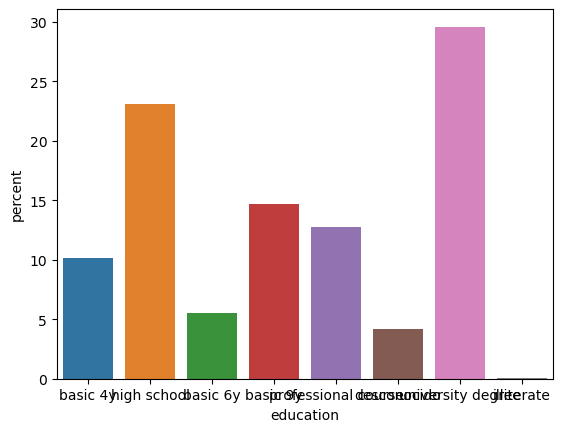

In [122]:
# grafico barras frecuencias absolutas y relativas (barplot, aunque countplot nos lo hace solo)

sns.countplot(data=df, x = 'education', hue='education', stat='percent');

## Tabla de contingencia

**Las tablas de contingencia**, también conocidas como **tablas de cruce o tablas de frecuencia cruzada**, son una herramienta fundamental en el análisis de datos categóricos. Estas tablas permiten resumir y visualizar la relación entre dos o más variables categóricas. Se utilizan comúnmente en estadística descriptiva para explorar patrones y relaciones en datos categóricos.

Una tabla de contingencia se organiza en filas y columnas, donde cada fila representa una categoría o nivel de una variable categórica y cada columna representa una categoría o nivel de otra variable categórica. En el cruce de una fila y una columna, se muestra la frecuencia con la que ocurre una combinación específica de categorías de ambas variables.

Las tablas de contingencia son útiles para analizar y responder preguntas como:

* ¿Existe alguna asociación o dependencia entre dos variables categóricas?
* ¿Cuál es la distribución de una variable categórica con respecto a otra?
* ¿Cuál es la frecuencia de cada categoría en el conjunto de datos?

Para calcular estas tablas de contingencia usaremos el método `pd.crosstab()` de Pandas. La sintaxis del método es:

```python
pd.crosstab(index, columns, rownames, colnames,  dropna, normalize)
```

Donde:

* `index`: Esta es la variable que se utilizará para las filas de la tabla de contingencia. Puede ser una Serie, una lista, un array, o el nombre de una columna en un DataFrame.
* `columns`: Esta es la variable que se utilizará para las columnas de la tabla de contingencia. Al igual que `index`, puede ser una Serie, una lista, un array, o el nombre de una columna en un DataFrame.
* `rownames` y `colnames` (opcional): Puedes proporcionar nombres para las filas y columnas de la tabla de contingencia.
* `dropna` (opcional): Si se establece en `True`, las filas y columnas que contengan valores NaN se eliminarán de la tabla de contingencia.
* `normalize` (opcional): Si se establece en `True`, los valores de la tabla se normalizarán para mostrar proporciones en lugar de recuentos absolutos.


In [124]:
# queremos analizar cómo se distribuye el nivel de educación de los clientes en función de su estado civil.

pd.crosstab(df['marital'], df['education'])




education,basic 4y,basic 6y,basic 9y,desconocido,high school,illiterate,professional course,university degree
marital,,,,,,,,
divorced,516,190,592,191,1240,2,689,1391
married,3372,1850,4340,1117,5387,15,3302,6701
single,468,346,1377,499,3298,1,1486,4630


In [125]:

pd.crosstab(df['marital'], df['education'], normalize=True)

education,basic 4y,basic 6y,basic 9y,desconocido,high school,illiterate,professional course,university degree
marital,,,,,,,,
divorced,0.012000,0.004419,0.013767,0.004442,0.028837,0.000047,0.016023,0.032349
married,0.078419,0.043023,0.100930,0.025977,0.125279,0.000349,0.076791,0.155837
single,0.010884,0.008047,0.032023,0.011605,0.076698,0.000023,0.034558,0.107674


Podemos observar que las personas con un "university degree" (grado universitario) tienden a estar casadas ("married") en comparación con las personas con niveles educativos más bajos. 

# 9.6 Medidas relativas

**Las medidas de posición relativa** son estadísticas que nos ayudan a comprender la posición o ubicación de un valor particular en relación con el conjunto de datos en el que se encuentra. Estas medidas nos permiten responder preguntas como "¿en qué posición se encuentra este valor en comparación con otros valores en el conjunto de datos?" o "¿qué porcentaje de valores se encuentra por debajo o por encima de este valor específico?".

Algunas de las medidas de posición relativa más comunes incluyen:

1. **Percentiles:** Los percentiles dividen un conjunto de datos en 100 partes iguales. Por ejemplo, el percentil 50 (también conocido como la mediana) divide los datos en dos partes iguales, con el 50% de los valores por debajo y el 50% por encima. El percentil 25 (primer cuartil) divide los datos en cuatro partes iguales, con el 25% de los valores por debajo y el 75% por encima.
2. **Cuartiles:** Los cuartiles son una subdivisión de los percentiles. El primer cuartil (Q1) es el percentil 25, el segundo cuartil (Q2) es el percentil 50 (la mediana) y el tercer cuartil (Q3) es el percentil 75. Los cuartiles se utilizan para describir la dispersión de los datos y para detectar valores atípicos.
3. **Deciles:** Los deciles dividen un conjunto de datos en 10 partes iguales. El decil 1 (D1) es el percentil 10, el decil 5 (D5) es el percentil 50 (la mediana) y el decil 9 (D9) es el percentil 90.

Estas medidas de posición relativa son útiles para entender cómo se sitúa un valor concreto en relación con los demás valores y para comparar distribuciones de datos. También son importantes en estadística descriptiva y análisis exploratorio de datos para resumir y visualizar la distribución de los datos.

## Percentiles

Los percentiles son medidas de posición relativa que dividen un conjunto de datos en partes iguales. Para calcularlos, se siguen estos pasos:

1. Se ordenan los datos de menor a mayor.
2. Se decide el percentil deseado (por ejemplo, el percentil 25, que corresponde al primer cuartil).
3. Se calcula la posición relativa del percentil en función del número total de datos. Por ejemplo, si tenemos 100 datos y queremos el percentil 25, calculamos el valor 0.25 \* 100 = 25.
4. Si la posición calculada es un número entero, el percentil es el valor en esa posición. Si la posición es un número decimal, se toma el promedio de los dos valores más cercanos en esa posición.

Para calcular los percentiles, usaremos el método `np.percentile()`. La sintaxis de esta función es:

```python
np.percentile(a, q)
```

* `a`: Esta es la columna de la cual deseamos calcular los percentiles.
* `q`: Aquí debemos proporcionar el percentil o los percentiles que deseamos calcular. Podemos proporcionar un solo valor (por ejemplo, `50` para calcular el percentil 50, que es la mediana) o una lista de valores para calcular varios percentiles al mismo tiempo.

En NumPy también tenemos el método `np.nanpercentile()` que funcionará igual, pero que lo aplicaremos en caso de que la columna con la que queramos trabajar tenga nulos.


In [137]:
# Calculamos los percentiles 25 y 75 de la Columna 'age'
# boxplot

percentil = np.percentile(df['age'], 66)
percentil

quartiles = np.quantile(df['age'],0.75)
quartiles


46.0